In [1]:
#!pip install kora # uncomment when running in Google Colab

In [2]:
import numpy as np

from bokeh import events
from bokeh.io import push_notebook, output_notebook, show
from bokeh.layouts import row
from bokeh.models import CustomJS, Div
from bokeh.plotting import ColumnDataSource
import bokeh.palettes

from kora.bokeh import figure

from sklearn import datasets
from sklearn.decomposition import PCA

from PIL import Image
import base64
from io import BytesIO

In [7]:
def gnp2im(image_np, bit_depth_scale_factor):
    """Converts an image stored as a 2-D grayscale Numpy array into a PIL image."""
    return Image.fromarray((image_np * bit_depth_scale_factor).astype(np.uint8), mode='L')

def to_base64(png):
    return "data:image/png;base64," + base64.b64encode(png).decode("utf-8")

def get_thumbnails(data, bit_depth_scale_factor):
    thumbnails = []
    for gnp in data:
        im = gnp2im(gnp, bit_depth_scale_factor)
        memout = BytesIO()
        im.save(memout, format='png')
        thumbnails.append(to_base64(memout.getvalue()))
    return thumbnails

def map_label_to_color(label):
    return viridis_palette[label]

def display_event(div, x, y, thumbnails, figure_width, figure_height, attributes=[], style = 'float:left;clear:left;font_size=13px'):
    "Build a suitable CustomJS to display the current event in the div model."
    return CustomJS(args=dict(div=div, x=x, y=y, thumbnails=thumbnails, figure_width=figure_width, figure_height=figure_height), code="""
        var attrs = %s; var args = []; var n = x.length;
        
        var test_x;
        var test_y;
        for (var i = 0; i < attrs.length; i++) {
            if (attrs[i] == 'x') {
                test_x = Number(cb_obj[attrs[i]]);
            }
            
            if (attrs[i] == 'y') {
                test_y = Number(cb_obj[attrs[i]]);
            }
        }
    
        var minDiffIndex = -1;
        var minDiff = 99999;
        var squareDiff;
        for (var i = 0; i < n; i++) {
            squareDiff = (test_x - x[i]) ** 2 + (test_y - y[i]) ** 2;
            if (squareDiff < minDiff) {
                minDiff = squareDiff;
                minDiffIndex = i;
            }
        }
        
        var img_tag_attrs = "height='" + (figure_height * 0.8) + "' width='" + (figure_width * 0.8) + "' style='float: left; margin: 0px 15px 15px 0px;' border='2'";
        var img_tag = "<div><img src='" + thumbnails[minDiffIndex] + "' " + img_tag_attrs + "></img></div>";
        var line = "<span style=%r>Index: " + minDiffIndex + "</span>" + img_tag + "\\n";
        div.text = "";
        var text = div.text.concat(line);
        var lines = text.split("\\n")
        if (lines.length > 35)
            lines.shift();
        div.text = lines.join("\\n");
    """ % (attributes, style))

def create_noise_dataset(n, h, w):
    images = np.random.rand(n, h, w)
    pca = PCA(n_components=1)
    z = pca.fit_transform(images.reshape((n, h * w)))
    labels = np.zeros(len(images))
    labels[z.flatten() <= 0] = 0
    labels[z.flatten() > 0] = 1
    noise_dataset = {
        'images': images,
        'target': labels
    }
    return noise_dataset

def create_diffraction_dataset():
  images = np.load('../../data/cspi_synthetic_dataset_diffraction_patterns_1024x1040.npy')
  labels = np.zeros(len(images)) # maybe cluster / normalize etc.
  diffraction_dataset = {
      'images': images,
      'target': labels
  }
  return diffraction_dataset

output_notebook()

Loading BokehJS ...

In [8]:
dataset = create_diffraction_dataset()

In [10]:
dataset.keys()

dict_keys(['images', 'target'])

In [11]:
#dataset = create_diffraction_dataset()
#dataset = datasets.load_digits()
#dataset = create_noise_dataset(1024, 64, 64)

data = dataset['images']
labels = dataset['target']

In [12]:
n, h, w = data.shape
n_labels = len(np.unique(labels))

print(n, h, w)
print(n_labels)

100 1024 1040
1


In [13]:
pca = PCA(n_components=2)

z = pca.fit_transform(data.reshape((n, h * w)))

z.shape

(100, 2)

In [14]:
x = z[:, 0]
y = z[:, 1]

In [15]:
bit_depth_scale_factor = 255
thumbnails = get_thumbnails(data, bit_depth_scale_factor)

In [16]:
viridis_palette = bokeh.palettes.viridis(n_labels)
colors = list(map(map_label_to_color, labels.astype(np.int)))

In [17]:
figure_width = 400
figure_height = 400

p = figure(width=figure_width, height=figure_height, tools="pan,wheel_zoom,box_zoom,reset")
p.scatter(x, y, fill_color=colors, fill_alpha=0.6, line_color=None)

div = Div()

layout = row(p, div)

point_attributes = ['x', 'y']
p.js_on_event(events.MouseMove, display_event(div, x, y, thumbnails, figure_width, figure_height, attributes=point_attributes))
#p.js_on_event(events.Tap, display_event(div, x, y, thumbnails, figure_width, figure_height, attributes=point_attributes))

show(layout)

In [18]:
from skimage import transform
from skimage.transform import resize
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'skimage'

In [ ]:
imgs_in = data
imgs_out_resize = np.zeros((n, h//2, w//2))
imgs_out_pyramid_reduce = np.zeros((n, h//2, w//2))

for i, _ in enumerate(imgs_in):
    imgs_out_resize[i,:,:] = transform.resize(imgs_in[i,:,:], output_shape=(h//2, w//2))
    imgs_out_pyramid_reduce[i,:,:] = transform.pyramid_reduce(imgs_in[i,:,:], downscale=2)


In [ ]:
import bokeh.palettes
grayscale_palette = bokeh.palettes.gray(256)

In [ ]:
def make_image_plot(img):
    min_x = -2.0
    max_x = 2.0
    min_y = -1.0
    max_y = 1.0

    p = figure(width=int(900/2), height=int(900/2),
                x_range = [min_x, max_x], y_range = [min_y, max_y])

    p.image(image=[img],             # image data
             x=[min_x],               # lower left x coord
             y=[min_y],               # lower left y coord
             dw=[max_x-min_x],        # *data space* width of image
             dh=[max_y-min_y],        # *data space* height of image
             palette=grayscale_palette,    # palette name
    )

    return p


In [ ]:
p_image = make_image_plot(data[0, :, :])

In [ ]:
show(row(p_image), notebook_handle=True)

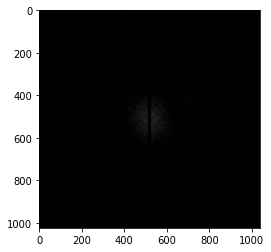

In [ ]:
idx = 2
plt.figure()
plt.imshow(imgs_in[idx], cmap='gray')
# plt.figure()
# plt.imshow(imgs_out_resize[idx], cmap='gray')
# plt.figure()
# plt.imshow(imgs_out_pyramid_reduce[idx], cmap='gray')